In [1]:
!nvidia-smi

Tue Dec  3 18:46:25 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 545.23.08              Driver Version: 545.23.08    CUDA Version: 12.3     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA A100-SXM4-80GB          Off | 00000000:01:00.0 Off |                    0 |
| N/A   37C    P0              72W / 500W |      4MiB / 81920MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

In [2]:
import numpy as np
import torch
from transformers import AutoTokenizer, AutoModel
import plotly.graph_objects as go
import wandb
import json
from sklearn.decomposition import PCA
import os
from tqdm import tqdm

In [3]:
class RSAAnalyzer:
    def __init__(self, model_names, batch_size=4):
        self.model_names = model_names
        self.batch_size = batch_size
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.results_dir = "model_results"
        os.makedirs(self.results_dir, exist_ok=True)
        
    def process_batch(self, texts, tokenizer, model):
        if tokenizer.pad_token is None:
            tokenizer.pad_token = tokenizer.eos_token
            model.config.pad_token_id = tokenizer.eos_token_id
            
        inputs = tokenizer(texts, 
                          padding='max_length',
                          truncation=True, 
                          max_length=512, 
                          return_tensors='pt').to(self.device)
        
        with torch.no_grad():
            outputs = model(**inputs, output_hidden_states=True)
        return outputs.hidden_states
    
    def compute_rdm(self, activations):
        """Compute RDM on GPU with proper dimension handling"""
        # Ensure activations are properly shaped and normalized
        if len(activations.shape) == 3:
            # If we have [batch, sequence, features]
            pooled = activations.mean(dim=1)  # Average over sequence length
        else:
            pooled = activations  # Already pooled

        # Normalize along the feature dimension (last dimension)
        normalized = pooled / (pooled.norm(dim=-1, keepdim=True) + 1e-8)

        # Compute correlation matrix
        similarity = torch.mm(normalized, normalized.t())

        # Convert to dissimilarity (RDM)
        rdm = 1 - similarity
        return rdm
    
    def analyze_single_model(self, model_name):
        print(f"Processing model: {model_name}")
        
        tokenizer = AutoTokenizer.from_pretrained(f"meta-llama/{model_name}")
        model = AutoModel.from_pretrained(f"meta-llama/{model_name}").to(self.device)
        
        with open('RSAData/cyber-questions.json', 'r') as f:
            data = json.load(f)
            texts = [item['question'] for item in data]
        
        all_layer_states = []
        first_batch = True
        
        for i in tqdm(range(0, len(texts), self.batch_size)):
            batch_texts = texts[i:i + self.batch_size]
            batch_states = self.process_batch(batch_texts, tokenizer, model)
            
            if first_batch:
                all_layer_states = [[] for _ in range(len(batch_states))]
                first_batch = False
            
            for layer_idx, hidden_state in enumerate(batch_states):
                pooled_state = hidden_state.mean(dim=1)
                all_layer_states[layer_idx].append(pooled_state)
        
        all_layer_states = [torch.cat(states, dim=0) for states in all_layer_states]
        
        # Compute RDMs for each layer
        layer_rdms = {f"layer_{i}": self.compute_rdm(states) 
                     for i, states in enumerate(all_layer_states)}
        
        # Save states and RDMs
        save_path = os.path.join(self.results_dir, f"{model_name}_states_cyber_data.npz")
        save_states = [state.cpu().numpy() for state in all_layer_states]
        np.savez_compressed(save_path, *save_states)
        
        rdm_save_path = os.path.join(self.results_dir, f"{model_name}_rdms_cyber_data.npz")
        save_rdms = {k: v.cpu().numpy() for k, v in layer_rdms.items()}
        np.savez_compressed(rdm_save_path, **save_rdms)
        
        del model
        torch.cuda.empty_cache()
        
        return save_path, rdm_save_path
    
    def visualize_layer_dynamics(self, states, model_name):
        """Create PCA visualization of layer dynamics with proper dimensionality handling"""
        fig = go.Figure()

        # Process all layers together for consistent PCA
        all_states = []
        for layer_states in states.values():
            # Ensure proper dimensionality
            pooled = layer_states.mean(dim=1) if len(layer_states.shape) > 2 else layer_states
            normalized = pooled / (pooled.norm(dim=-1, keepdim=True) + 1e-8)
            # Reshape to ensure 2D array with samples as rows
            reshaped = normalized.reshape(normalized.shape[0], -1)
            all_states.append(reshaped.cpu().numpy())

        # Stack all states and ensure proper dimensionality
        combined_states = np.vstack(all_states)

        # Determine number of components based on data dimensionality
        n_components = min(2, min(combined_states.shape))
        if n_components < 2:
            # If only 1D, create synthetic second dimension
            reduced = np.column_stack([combined_states, np.zeros_like(combined_states)])
        else:
            # Perform PCA
            reduced = PCA(n_components=n_components).fit_transform(combined_states)

        # Plot each layer's representations
        num_layers = len(states)
        samples_per_layer = reduced.shape[0] // num_layers

        for layer_idx in range(num_layers):
            start_idx = layer_idx * samples_per_layer
            end_idx = start_idx + samples_per_layer
            layer_reduced = reduced[start_idx:end_idx]

            percentage = (layer_idx / (num_layers-1)) * 100
            fig.add_trace(go.Scatter(
                x=layer_reduced[:, 0],
                y=layer_reduced[:, 1],
                mode='markers',
                name=f'Layer {layer_idx} ({percentage:.1f}%)',
                marker=dict(
                    size=8,
                    opacity=0.7,
                    symbol='circle',
                    color=f'rgb({int(255*layer_idx/num_layers)}, 0, {255-int(255*layer_idx/num_layers)})'
                )
            ))

        fig.update_layout(
            title=f'Layer-wise Representations - {model_name} - Cyber Data',
            xaxis_title='PCA Component 1',
            yaxis_title='PCA Component 2',
            template='plotly_white',
            showlegend=True,
            # Modified legend positioning and style
            legend=dict(
                yanchor="top",
                y=1.0,
                xanchor="left",
                x=1.02,  # Move legend outside the plot area
                itemsizing='constant',
                bgcolor='rgba(255, 255, 255, 0.8)',  # Semi-transparent background
                bordercolor='rgba(0, 0, 0, 0.2)',
                borderwidth=1
            ),
            # Adjust margins to accommodate legend
            margin=dict(r=200),  # Add right margin for legend
            width=1400,  # Increase width to accommodate legend
            height=800
        )

        return fig
    
    def plot_rdm_heatmap(self, rdm, title):
        """Plot RDM heatmap with improved visualization"""
        fig = go.Figure(data=go.Heatmap(
            z=rdm.cpu().numpy(),
            colorscale='Viridis',
            colorbar=dict(title='Dissimilarity'),
            hoverongaps=False
        ))
        
        fig.update_layout(
            title=title,
            width=800,
            height=800,
            template='plotly_white'
        )
        
        return fig
    
    def plot_layer_similarities(self, rdms, model_name):
        """Plot layer-wise similarity matrix with percentages"""
        num_layers = len(rdms)
        similarity_matrix = torch.zeros((num_layers, num_layers), device=self.device)
        
        for i, rdm1 in enumerate(rdms.values()):
            for j, rdm2 in enumerate(rdms.values()):
                similarity_matrix[i, j] = torch.norm(rdm1 - rdm2)
        
        labels = [f"Layer {i}\n({i/num_layers*100:.1f}%)" for i in range(num_layers)]
        
        fig = go.Figure(data=go.Heatmap(
            z=similarity_matrix.cpu().numpy(),
            x=labels,
            y=labels,
            colorscale='Viridis',
            colorbar=dict(title='Layer Distance'),
            hoverongaps=False
        ))
        
        fig.update_layout(
            title=f'Layer-wise RSA Similarities - {model_name} - Cyber Data',
            xaxis_title='Layer',
            yaxis_title='Layer',
            width=1200,
            height=1000,
            template='plotly_white'
        )
        
        return fig

    def visualize_model_results(self, model_name, use_wandb=True):
        states_path = os.path.join(self.results_dir, f"{model_name}_states.npz")
        rdms_path = os.path.join(self.results_dir, f"{model_name}_rdms.npz")
        
        loaded_states = np.load(states_path)
        loaded_rdms = np.load(rdms_path)
        
        states = {f"layer_{i}": torch.from_numpy(arr).to(self.device) 
                 for i, arr in enumerate(loaded_states.values())}
        rdms = {k: torch.from_numpy(v).to(self.device) 
                for k, v in loaded_rdms.items()}
        
        dynamics_fig = self.visualize_layer_dynamics(states, model_name)
        similarity_fig = self.plot_layer_similarities(rdms, model_name)
        rdm_figs = {layer_name: self.plot_rdm_heatmap(rdm, f'RDM - {model_name} - {layer_name} - Cyber Data')
                    for layer_name, rdm in rdms.items()}
        
        if use_wandb:
            wandb.log({
                f"{model_name}/layer_dynamics": dynamics_fig,
                f"{model_name}/layer_similarities": similarity_fig,
                **{f"{model_name}/rdm/{k}": v for k, v in rdm_figs.items()}
            })
        
        dynamics_fig.show()
        similarity_fig.show()
        
        return dynamics_fig, similarity_fig, rdm_figs

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: ai_ritik (visualaiblog). Use `wandb login --relogin` to force relogin


Processing model: llama-3.2-1b


100%|██████████| 557/557 [02:12<00:00,  4.19it/s]


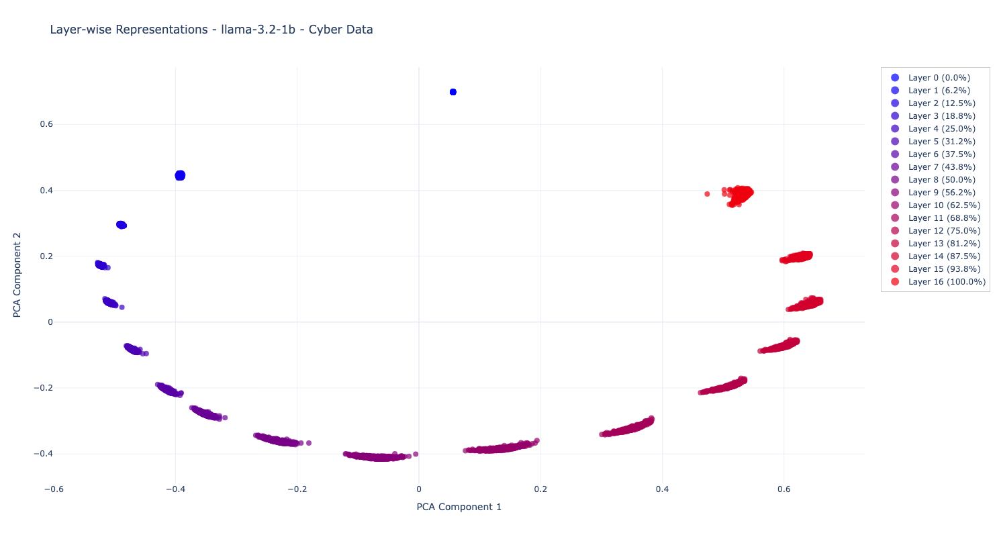

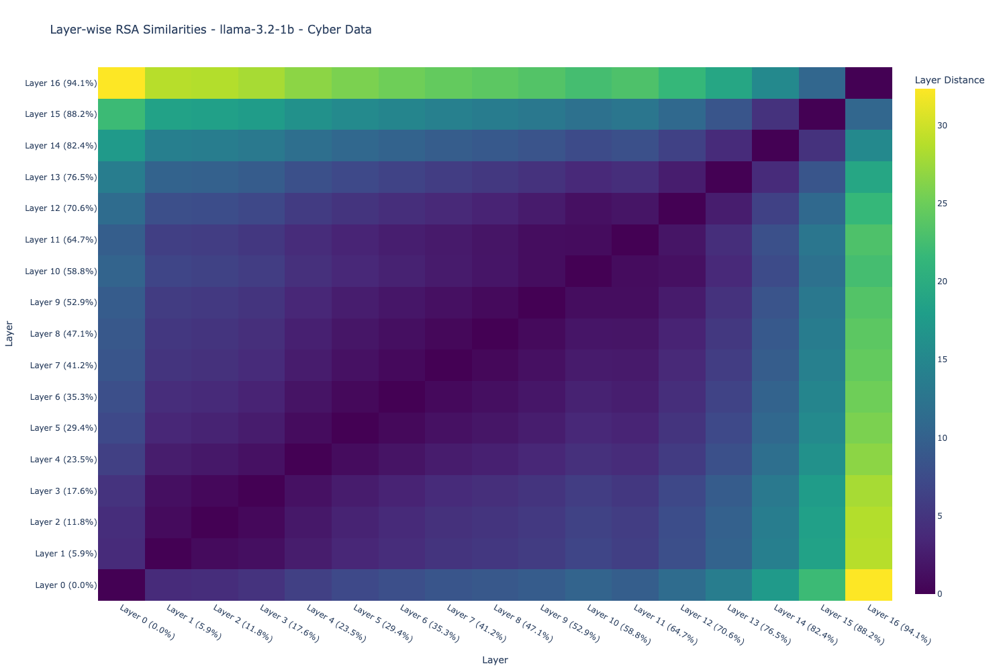

Processing model: llama-3.2-3b


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

100%|██████████| 557/557 [06:25<00:00,  1.45it/s]


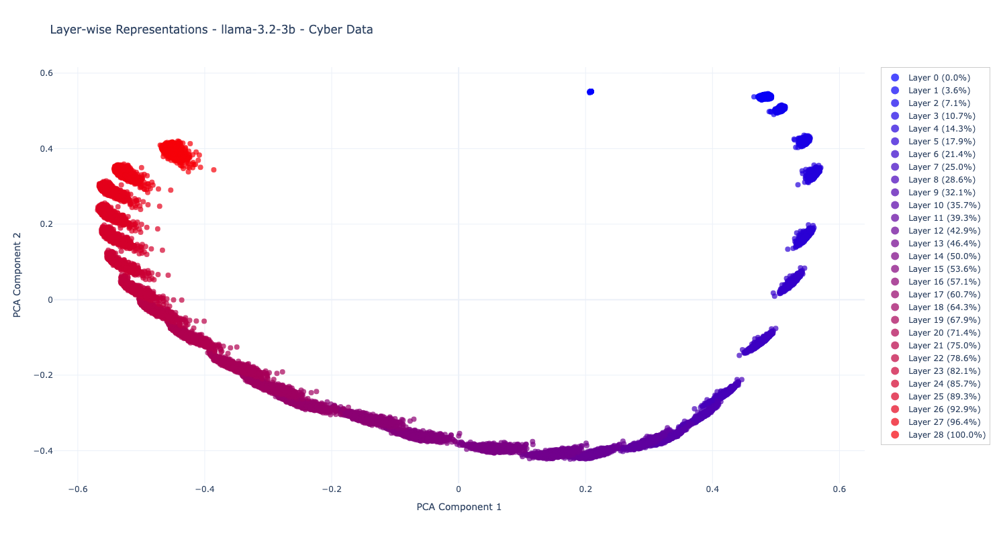

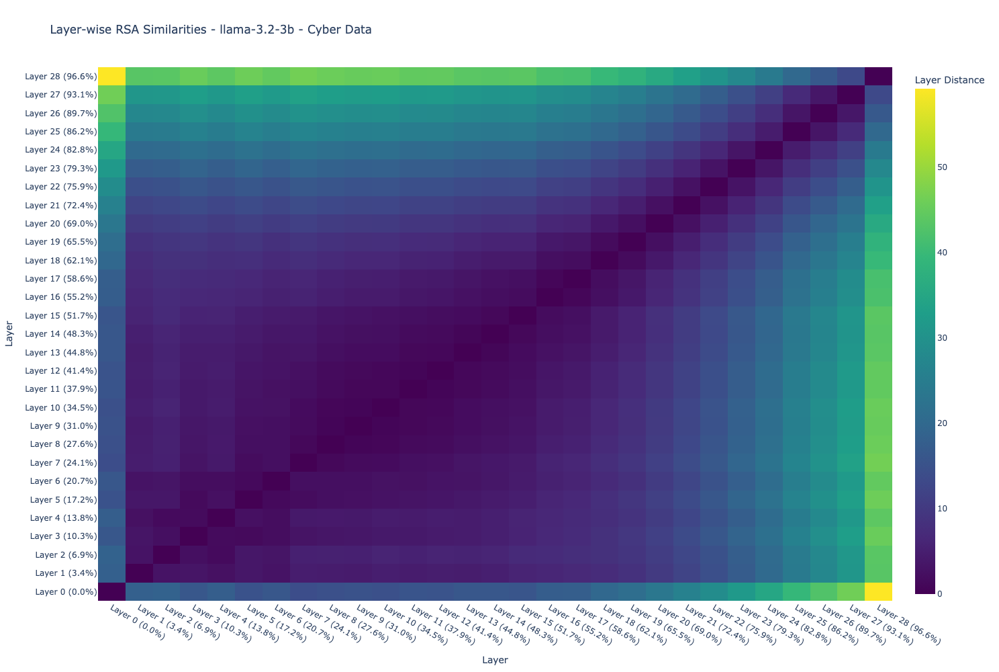

Processing model: llama-3.1-8b


Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]

100%|██████████| 557/557 [15:50<00:00,  1.71s/it]


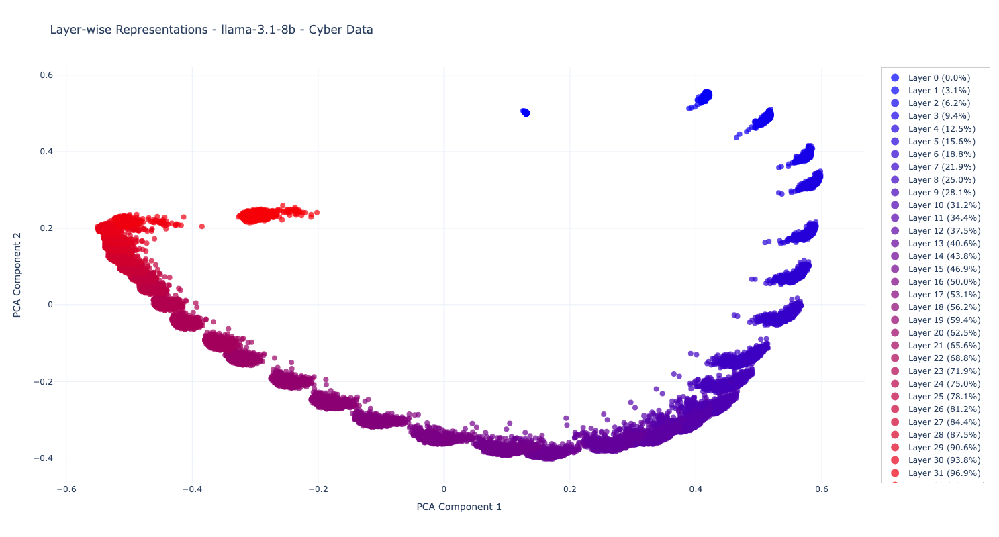

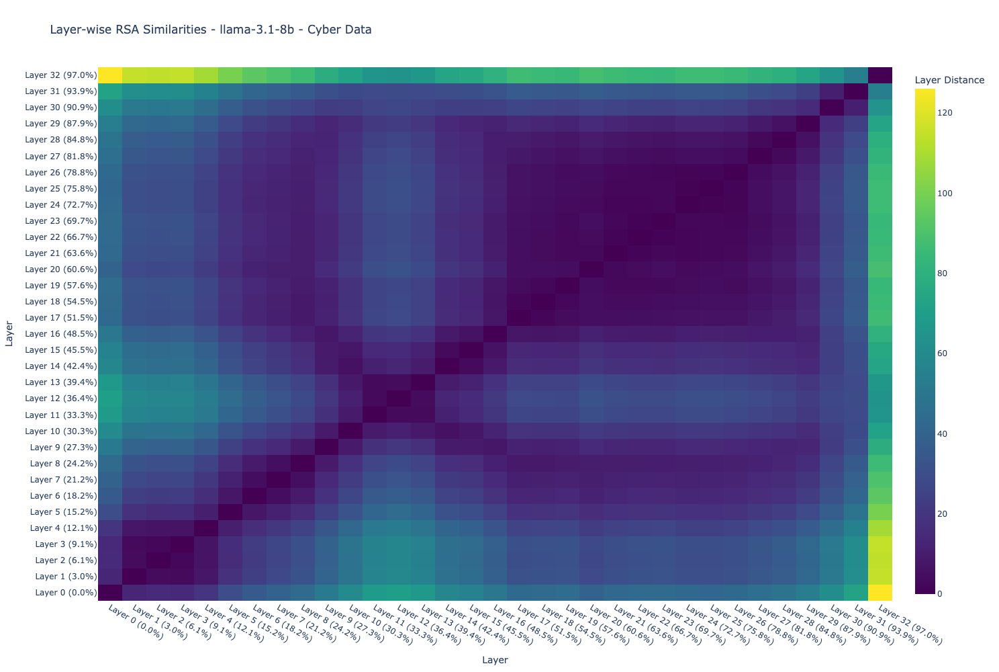

In [4]:
# Initialize wandb
wandb.init(project="llama-rsa-analysis-cyber")

# Initialize analyzer and process models
analyzer = RSAAnalyzer(["llama-3.2-1b", "llama-3.2-3b", "llama-3.1-8b"])

for model_name in analyzer.model_names:
    states_path, rdms_path = analyzer.analyze_single_model(model_name)
    dynamics_fig, similarity_fig, rdm_figs = analyzer.visualize_model_results(model_name)

wandb.finish()